# Background Subtraction: Object Detection in Video
## Understanding MOG2, KNN, Frame Differencing & Surveillance Video Analysis

This notebook covers advanced background subtraction techniques for detecting moving objects in video sequences, essential for surveillance systems and video analysis applications.

In [1]:
# Import required libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import warnings
warnings.filterwarnings('ignore')

## 1. Introduction to Background Subtraction

### What is Background Subtraction?
Background subtraction is a technique to identify moving objects by separating the foreground (moving objects) from the background (static or slowly changing scene). It's crucial for:
- Video surveillance
- Object tracking
- Motion detection
- Activity recognition

### Key Concepts:
- **Background**: Stationary or slowly changing parts of the scene
- **Foreground**: Moving objects that differ from the background model
- **Segmentation**: Binary mask indicating foreground vs background pixels

### Applications:
1. Security and surveillance systems
2. Traffic monitoring
3. Crowd analysis
4. Motion capture
5. Video analysis and annotation

## 2. Frame Differencing - Simplest Approach

### Theory:
Frame differencing is the most basic background subtraction technique. It works by computing the absolute difference between consecutive frames:

**Foreground = |Frame(t) - Frame(t-1)|**

### Advantages:
- Simple and fast to compute
- Low memory requirements
- Works well for fast-moving objects

### Disadvantages:
- Very sensitive to noise and camera jitter
- Ghost objects (leftover from previous frames)
- Poor for slowly moving objects
- No true "background model"

### When to Use:
- Real-time applications with strict computational constraints
- Detecting sudden changes
- Preliminary motion detection

In [2]:
### Frame Differencing Implementation

def frame_differencing(frame1, frame2, threshold=30):
    """
    Simple frame differencing method
    
    Args:
        frame1: Previous frame (uint8)
        frame2: Current frame (uint8)
        threshold: Threshold for binary mask (default=30)
    
    Returns:
        foreground_mask: Binary mask of moving regions
    """
    # Convert to grayscale if needed
    if len(frame1.shape) == 3:
        gray1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
        gray2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)
    else:
        gray1 = frame1.copy()
        gray2 = frame2.copy()
    
    # Compute absolute difference
    diff = cv2.absdiff(gray1, gray2)
    
    # Apply threshold
    _, mask = cv2.threshold(diff, threshold, 255, cv2.THRESH_BINARY)
    
    # Apply morphological operations to remove noise
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=1)
    
    return mask, diff

# Example with sample frames
print("Frame Differencing Implementation Complete")
print("\nHow it works:")
print("1. Convert frames to grayscale")
print("2. Compute absolute difference between consecutive frames")
print("3. Apply threshold to get binary mask")
print("4. Apply morphological operations to reduce noise")

Frame Differencing Implementation Complete

How it works:
1. Convert frames to grayscale
2. Compute absolute difference between consecutive frames
3. Apply threshold to get binary mask
4. Apply morphological operations to reduce noise


## 3. MOG2 - Mixture of Gaussians (Version 2)

### Theory:
MOG2 is an advanced statistical background subtraction algorithm that models the background using a mixture of Gaussian distributions.

### Key Concepts:
- **Gaussian Mixture Model**: Each pixel is modeled as a mixture of K Gaussian distributions
- **Adaptive Model**: The model updates over time to adapt to changing lighting and weather
- **Probability**: Pixels are classified based on how likely they belong to background Gaussians
- **Shadow Removal**: Includes detection and removal of shadows

### Mathematical Foundation:
- Each pixel's intensity is modeled as: P(x) = Σ(w_i * N(x, μ_i, σ_i²))
  - w_i: weight of i-th Gaussian
  - N: Gaussian distribution
  - μ_i: mean of i-th Gaussian
  - σ_i²: variance of i-th Gaussian

### Advantages:
- Handles gradual lighting changes (e.g., sunset, dawn)
- Adapts to camera jitter and waving trees
- Robust shadow removal
- Better foreground detection

### Disadvantages:
- Computationally more expensive than frame differencing
- Requires parameter tuning
- Needs initialization period (background learning)

In [3]:
### MOG2 Implementation using OpenCV

class MOG2BackgroundSubtractor:
    """
    MOG2 Background Subtractor wrapper
    """
    def __init__(self, history=500, var_threshold=16, detect_shadows=True):
        """
        Initialize MOG2 background subtractor
        
        Args:
            history: Length of the pixel history (default=500)
            var_threshold: Threshold on the squared Mahalanobis distance (default=16)
            detect_shadows: If True, shadow detection enabled (default=True)
        """
        self.mog2 = cv2.createBackgroundSubtractorMOG2(
            detectShadows=detect_shadows,
            varThreshold=var_threshold,
            history=history
        )
    
    def apply(self, frame):
        """
        Apply MOG2 background subtraction
        
        Args:
            frame: Input frame
        
        Returns:
            mask: Foreground mask
        """
        return self.mog2.apply(frame)

# Create instance
mog2_subtractor = MOG2BackgroundSubtractor(
    history=500,
    var_threshold=16,
    detect_shadows=True
)

print("MOG2 Background Subtractor Created")
print("\nMOG2 Parameters:")
print(f"  History: Number of frames to model the background")
print(f"  Var Threshold: Mahalanobis distance threshold (sensitivity)")
print(f"  Detect Shadows: Flag to include shadow detection")
print("\nUsage: mask = mog2_subtractor.apply(frame)")

MOG2 Background Subtractor Created

MOG2 Parameters:
  History: Number of frames to model the background
  Var Threshold: Mahalanobis distance threshold (sensitivity)
  Detect Shadows: Flag to include shadow detection

Usage: mask = mog2_subtractor.apply(frame)


## 4. KNN - K-Nearest Neighbors Background Subtractor

### Theory:
KNN background subtraction uses a non-parametric approach storing recent pixel values and comparing them with the current pixel.

### How KNN Works:
1. **Pixel History**: For each pixel, maintain a history of last N values
2. **Distance Calculation**: Compute distance between current pixel and historical values
3. **K-Nearest Search**: Find K nearest neighbors in the history
4. **Decision**: If most neighbors are background, pixel is background; else foreground

### Key Concepts:
- **Non-parametric**: No assumption about pixel distribution
- **Local Neighborhood**: Uses spatial and temporal neighborhoods
- **Adaptive**: Automatically updates with new values

### Advantages:
- Handles multimodal background distributions
- Works well with dynamic backgrounds (waving trees, fountains)
- Good adaptation to sudden illumination changes
- No explicit shadow removal but handles shadows naturally

### Disadvantages:
- Memory intensive (stores pixel history)
- Requires careful selection of K value
- More computationally expensive than MOG2
- Need for proper initialization

In [4]:
### KNN Implementation using OpenCV

class KNNBackgroundSubtractor:
    """
    KNN Background Subtractor wrapper
    """
    def __init__(self, history=500, dist2_threshold=400, detect_shadows=True):
        """
        Initialize KNN background subtractor
        
        Args:
            history: Length of the pixel history (default=500)
            dist2_threshold: Squared distance threshold (default=400)
            detect_shadows: If True, shadow detection enabled (default=True)
        """
        self.knn = cv2.createBackgroundSubtractorKNN(
            detectShadows=detect_shadows,
            dist2Threshold=dist2_threshold,
            history=history
        )
    
    def apply(self, frame):
        """
        Apply KNN background subtraction
        
        Args:
            frame: Input frame
        
        Returns:
            mask: Foreground mask
        """
        return self.knn.apply(frame)

# Create instance
knn_subtractor = KNNBackgroundSubtractor(
    history=500,
    dist2_threshold=400,
    detect_shadows=True
)

print("KNN Background Subtractor Created")
print("\nKNN Parameters:")
print(f"  History: Number of frames to store in history")
print(f"  Dist2 Threshold: Squared distance threshold (sensitivity)")
print(f"  Detect Shadows: Flag to include shadow detection")
print("\nUsage: mask = knn_subtractor.apply(frame)")

KNN Background Subtractor Created

KNN Parameters:
  History: Number of frames to store in history
  Dist2 Threshold: Squared distance threshold (sensitivity)
  Detect Shadows: Flag to include shadow detection

Usage: mask = knn_subtractor.apply(frame)


## 5. Comparison: Frame Differencing vs MOG2 vs KNN

| Aspect | Frame Differencing | MOG2 | KNN |
|--------|-------------------|------|-----|
| **Complexity** | Very Simple | Complex | Complex |
| **Computation** | Very Fast | Medium | Medium-Slow |
| **Memory** | Very Low | Medium | High |
| **Dynamic Backgrounds** | Poor | Good | Excellent |
| **Lighting Changes** | Poor | Excellent | Good |
| **Shadow Removal** | None | Yes | Yes |
| **Adaptation Speed** | Immediate | Gradual | Gradual |
| **Noise Robustness** | Poor | Good | Good |
| **Slow Motion** | Poor | Excellent | Good |
| **Best Use Case** | Real-time alerts | General surveillance | Dynamic scenes |

### Selection Guide:
- **Use Frame Differencing** if:
  - Extreme speed is critical
  - Memory is severely limited
  - Working with simple, controlled environments
  - Detecting rapid motion only

- **Use MOG2** if:
  - Need robust background modeling
  - Static or semi-static scenes
  - Shadows are problematic
  - General-purpose surveillance

- **Use KNN** if:
  - Highly dynamic backgrounds
  - Fountains, waves, trees
  - Complex lighting conditions
  - Memory is available

## 6. Practical Example: Creating Synthetic Surveillance Video

We'll create a synthetic video with:
- Static background (road)
- Moving foreground objects (vehicles)
- Shadows
- Lighting variations

Then compare all three methods.

In [5]:
### Generate Synthetic Surveillance Video

def create_synthetic_video(num_frames=100, width=320, height=240):
    """
    Create synthetic surveillance video with moving objects
    
    Args:
        num_frames: Number of frames to generate
        width: Frame width
        height: Frame height
    
    Returns:
        frames: List of frames
    """
    frames = []
    
    for frame_num in range(num_frames):
        # Create base frame (road background - gray with slight variations)
        frame = np.ones((height, width, 3), dtype=np.uint8) * 80
        
        # Add road markings (white lines)
        cv2.line(frame, (width//4, 0), (width//4, height), (200, 200, 200), 2)
        cv2.line(frame, (3*width//4, 0), (3*width//4, height), (200, 200, 200), 2)
        
        # Simulate lighting variation (sunrise/sunset effect)
        lighting = int(30 + 20 * np.sin(frame_num * np.pi / num_frames))
        frame = cv2.add(frame, (lighting, lighting, lighting))
        
        # Draw multiple moving objects (vehicles)
        # Vehicle 1: Moving right
        v1_x = int(50 + frame_num * 1.5)
        if v1_x < width + 20:
            cv2.rectangle(frame, (v1_x, 80), (v1_x + 40, 110), (0, 0, 255), -1)  # Red
            cv2.rectangle(frame, (v1_x + 5, 85), (v1_x + 15, 95), (0, 255, 0), -1)  # Window
            # Shadow
            cv2.ellipse(frame, (v1_x + 20, 130), (25, 15), 0, 0, 360, (50, 50, 50), -1)
        
        # Vehicle 2: Moving left from right
        v2_x = int(width - 50 - frame_num * 1.0)
        if v2_x > -20:
            cv2.rectangle(frame, (v2_x, 150), (v2_x + 50, 180), (0, 255, 0), -1)  # Green
            cv2.rectangle(frame, (v2_x + 10, 155), (v2_x + 25, 165), (0, 255, 255), -1)  # Window
            # Shadow
            cv2.ellipse(frame, (v2_x + 25, 200), (30, 15), 0, 0, 360, (50, 50, 50), -1)
        
        # Vehicle 3: Vertical motion
        v3_y = int(50 + frame_num * 0.8)
        if v3_y < height + 20:
            cv2.rectangle(frame, (150, v3_y), (180, v3_y + 30), (255, 0, 0), -1)  # Blue
            cv2.rectangle(frame, (160, v3_y + 5), (170, v3_y + 15), (255, 255, 0), -1)  # Window
        
        # Add Gaussian noise for realism
        noise = np.random.normal(0, 5, frame.shape)
        frame = cv2.add(frame, noise.astype(np.uint8))
        
        frames.append(frame)
    
    return frames

# Generate video
frames = create_synthetic_video(num_frames=100, width=320, height=240)
print(f"Generated {len(frames)} frames of size {frames[0].shape}")
print(f"Frame shape: {frames[0].shape}")
print(f"Frame dtype: {frames[0].dtype}")

Generated 100 frames of size (240, 320, 3)
Frame shape: (240, 320, 3)
Frame dtype: uint8


In [6]:
### Apply All Methods to Synthetic Video

# Initialize all background subtractors
mog2 = cv2.createBackgroundSubtractorMOG2(detectShadows=True)
knn = cv2.createBackgroundSubtractorKNN(detectShadows=True)

# Store results
results = {
    'frame_diff': [],
    'mog2': [],
    'knn': []
}

# Process video
previous_frame = None
for i, frame in enumerate(frames):
    # Frame Differencing
    if previous_frame is not None:
        fd_mask, _ = frame_differencing(previous_frame, frame, threshold=25)
        results['frame_diff'].append(fd_mask)
    
    # MOG2
    mog2_mask = mog2.apply(frame)
    results['mog2'].append(mog2_mask)
    
    # KNN
    knn_mask = knn.apply(frame)
    results['knn'].append(knn_mask)
    
    previous_frame = frame.copy()

print("✓ All methods applied to video")
print(f"Frame Differencing results: {len(results['frame_diff'])} masks")
print(f"MOG2 results: {len(results['mog2'])} masks")
print(f"KNN results: {len(results['knn'])} masks")

✓ All methods applied to video
Frame Differencing results: 99 masks
MOG2 results: 100 masks
KNN results: 100 masks


Comparison at Frame 30 (Early video, learning phase):


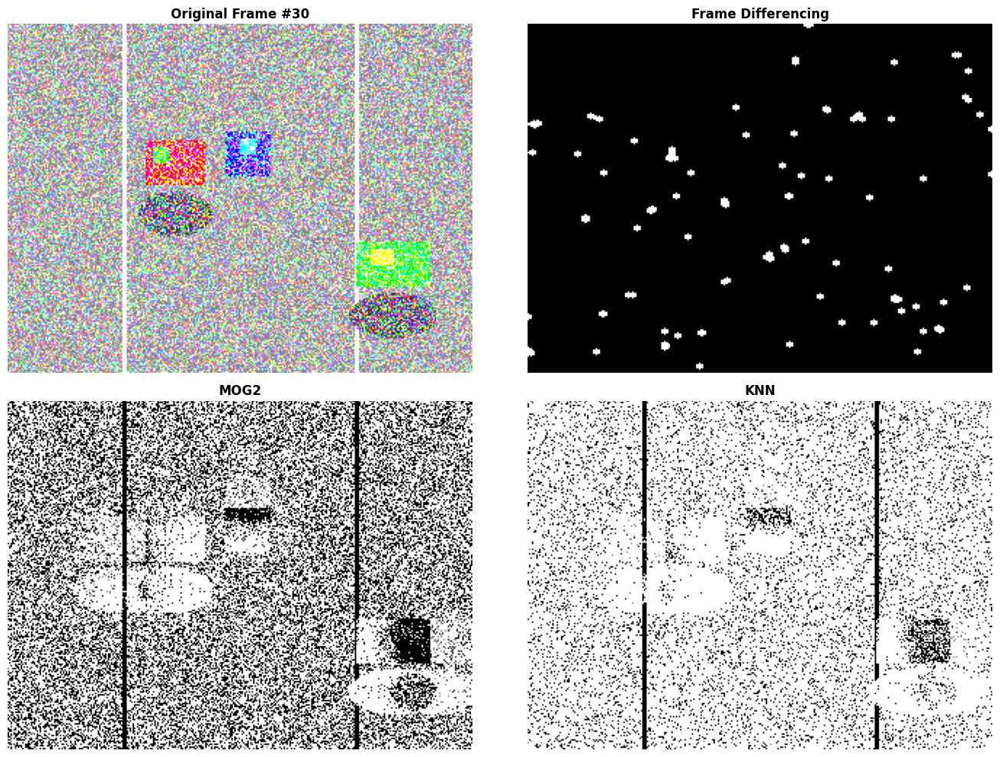

In [7]:
### Visualize Results at Different Frames

def visualize_comparison(frame_idx, frames, results):
    """Visualize all methods at a specific frame"""
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    frame = frames[frame_idx]
    
    # Original frame
    axes[0, 0].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    axes[0, 0].set_title(f'Original Frame #{frame_idx}', fontsize=12, fontweight='bold')
    axes[0, 0].axis('off')
    
    # Frame Differencing
    if frame_idx > 0 and frame_idx - 1 < len(results['frame_diff']):
        axes[0, 1].imshow(results['frame_diff'][frame_idx - 1], cmap='gray')
        axes[0, 1].set_title('Frame Differencing', fontsize=12, fontweight='bold')
    else:
        axes[0, 1].text(0.5, 0.5, 'Need previous frame', ha='center', va='center')
        axes[0, 1].set_title('Frame Differencing', fontsize=12, fontweight='bold')
    axes[0, 1].axis('off')
    
    # MOG2
    if frame_idx < len(results['mog2']):
        axes[1, 0].imshow(results['mog2'][frame_idx], cmap='gray')
        axes[1, 0].set_title('MOG2', fontsize=12, fontweight='bold')
    axes[1, 0].axis('off')
    
    # KNN
    if frame_idx < len(results['knn']):
        axes[1, 1].imshow(results['knn'][frame_idx], cmap='gray')
        axes[1, 1].set_title('KNN', fontsize=12, fontweight='bold')
    axes[1, 1].axis('off')
    
    plt.tight_layout()
    plt.show()

# Show comparison at different frames
print("Comparison at Frame 30 (Early video, learning phase):")
visualize_comparison(30, frames, results)


Comparison at Frame 60 (Stable background model):


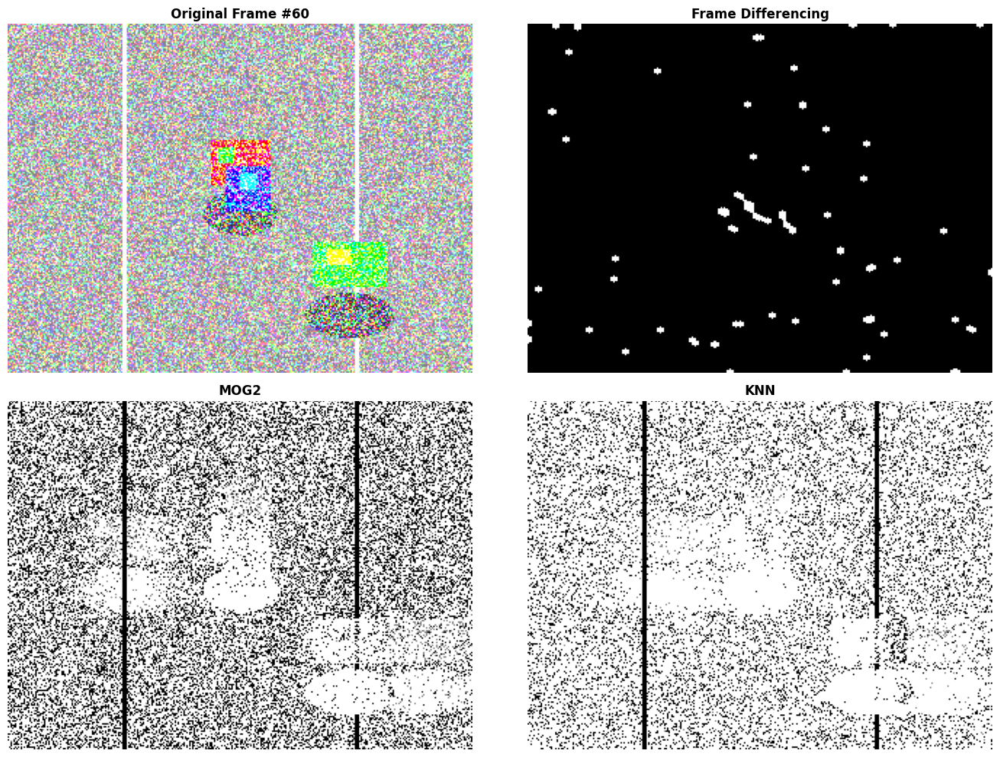


Comparison at Frame 90 (Multiple objects detected):


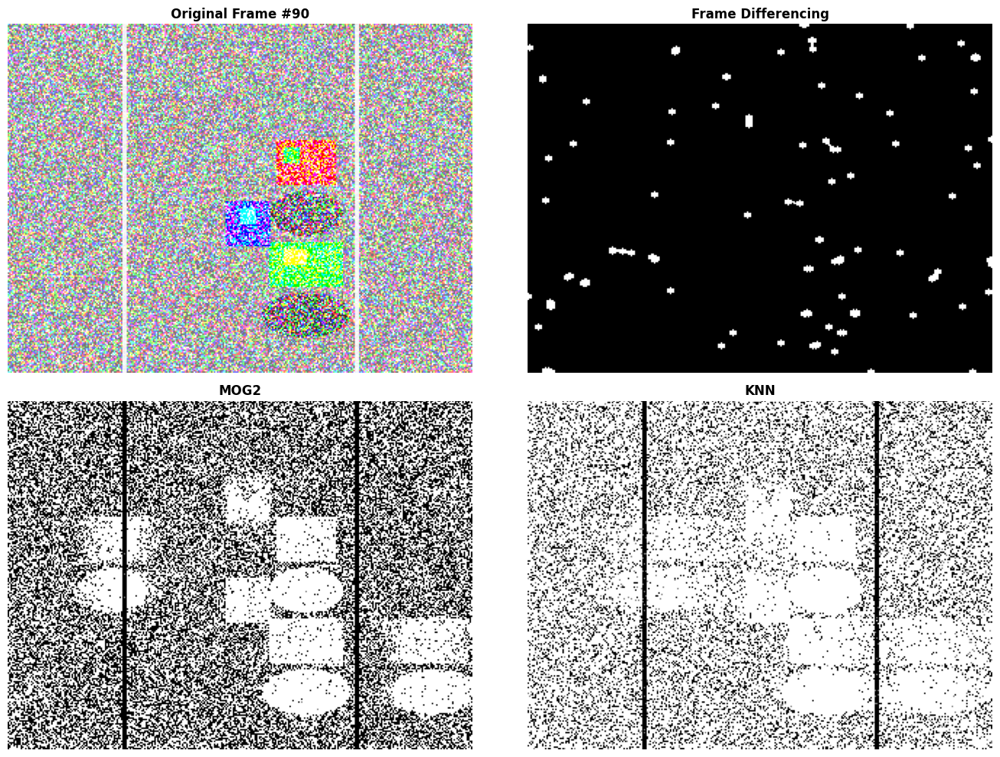

In [8]:
print("\nComparison at Frame 60 (Stable background model):")
visualize_comparison(60, frames, results)

print("\nComparison at Frame 90 (Multiple objects detected):")
visualize_comparison(90, frames, results)

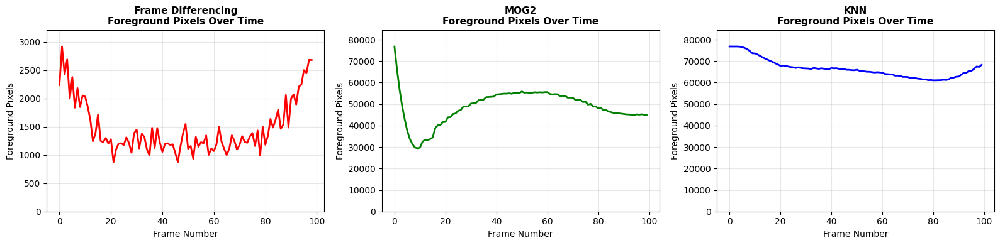


STATISTICAL ANALYSIS

Method               Mean            Std Dev         Min             Max            
----------------------------------------------------------------------
Frame Diff                     1476            463            872           2917
MOG2                          48638           7747          29448          76800
KNN                           66463           4215          61056          76800


In [9]:
### Quantitative Analysis

# Calculate statistics for each method
def analyze_masks(results, method_name):
    """Analyze foreground pixels across frames"""
    foreground_counts = []
    
    if method_name == 'frame_diff':
        masks = results['frame_diff']
    elif method_name == 'mog2':
        masks = results['mog2']
    else:  # knn
        masks = results['knn']
    
    for mask in masks:
        # Count white pixels (foreground)
        fg_pixels = np.sum(mask > 0)
        foreground_counts.append(fg_pixels)
    
    return np.array(foreground_counts)

# Analyze each method
fd_counts = analyze_masks(results, 'frame_diff')
mog2_counts = analyze_masks(results, 'mog2')
knn_counts = analyze_masks(results, 'knn')

# Plot temporal evolution
fig, axes = plt.subplots(1, 3, figsize=(16, 4))

# Frame Differencing
axes[0].plot(fd_counts, 'r-', linewidth=2)
axes[0].set_title('Frame Differencing\nForeground Pixels Over Time', fontsize=11, fontweight='bold')
axes[0].set_xlabel('Frame Number')
axes[0].set_ylabel('Foreground Pixels')
axes[0].grid(True, alpha=0.3)
axes[0].set_ylim([0, max(fd_counts) * 1.1])

# MOG2
axes[1].plot(mog2_counts, 'g-', linewidth=2)
axes[1].set_title('MOG2\nForeground Pixels Over Time', fontsize=11, fontweight='bold')
axes[1].set_xlabel('Frame Number')
axes[1].set_ylabel('Foreground Pixels')
axes[1].grid(True, alpha=0.3)
axes[1].set_ylim([0, max(mog2_counts) * 1.1])

# KNN
axes[2].plot(knn_counts, 'b-', linewidth=2)
axes[2].set_title('KNN\nForeground Pixels Over Time', fontsize=11, fontweight='bold')
axes[2].set_xlabel('Frame Number')
axes[2].set_ylabel('Foreground Pixels')
axes[2].grid(True, alpha=0.3)
axes[2].set_ylim([0, max(knn_counts) * 1.1])

plt.tight_layout()
plt.show()

# Statistical summary
print("\n" + "="*70)
print("STATISTICAL ANALYSIS")
print("="*70)
print(f"\n{'Method':<20} {'Mean':<15} {'Std Dev':<15} {'Min':<15} {'Max':<15}")
print("-"*70)
print(f"{'Frame Diff':<20} {fd_counts.mean():>14.0f} {fd_counts.std():>14.0f} {fd_counts.min():>14.0f} {fd_counts.max():>14.0f}")
print(f"{'MOG2':<20} {mog2_counts.mean():>14.0f} {mog2_counts.std():>14.0f} {mog2_counts.min():>14.0f} {mog2_counts.max():>14.0f}")
print(f"{'KNN':<20} {knn_counts.mean():>14.0f} {knn_counts.std():>14.0f} {knn_counts.min():>14.0f} {knn_counts.max():>14.0f}")
print("="*70)

## 7. Moving Object Detection in Surveillance Video

### Object Detection Pipeline:
1. **Background Subtraction**: Get foreground mask
2. **Morphological Operations**: Clean noise
3. **Contour Detection**: Find object boundaries
4. **Filtering**: Remove false positives
5. **Bounding Box Detection**: Track objects
6. **Post-Processing**: Merge overlapping boxes

### Applications:
- Vehicle counting
- Crowd monitoring
- Intrusion detection
- Abandoned object detection
- Activity recognition

In [10]:
### Object Detection Implementation

class SurveillanceObjectDetector:
    """
    Detects and tracks moving objects in surveillance video
    """
    def __init__(self, background_subtractor='mog2', min_area=100):
        """
        Initialize detector
        
        Args:
            background_subtractor: 'mog2' or 'knn' (default='mog2')
            min_area: Minimum object area to consider (default=100)
        """
        self.min_area = min_area
        self.kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
        
        if background_subtractor == 'mog2':
            self.bg_subtractor = cv2.createBackgroundSubtractorMOG2(detectShadows=True)
        elif background_subtractor == 'knn':
            self.bg_subtractor = cv2.createBackgroundSubtractorKNN(detectShadows=True)
    
    def detect_objects(self, frame):
        """
        Detect moving objects in frame
        
        Args:
            frame: Input frame
        
        Returns:
            detections: List of (x, y, w, h) bounding boxes
            mask: Foreground mask
        """
        # Get foreground mask
        mask = self.bg_subtractor.apply(frame)
        
        # Remove shadows (value 127)
        mask[mask == 127] = 0
        
        # Morphological operations
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, self.kernel, iterations=2)
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, self.kernel, iterations=2)
        
        # Find contours
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        detections = []
        for contour in contours:
            area = cv2.contourArea(contour)
            
            # Filter by minimum area
            if area >= self.min_area:
                x, y, w, h = cv2.boundingRect(contour)
                detections.append((x, y, w, h))
        
        return detections, mask
    
    def draw_detections(self, frame, detections):
        """
        Draw bounding boxes on frame
        
        Args:
            frame: Input frame
            detections: List of (x, y, w, h)
        
        Returns:
            annotated_frame: Frame with bounding boxes
        """
        annotated = frame.copy()
        
        for i, (x, y, w, h) in enumerate(detections):
            # Draw bounding box
            cv2.rectangle(annotated, (x, y), (x+w, y+h), (0, 255, 0), 2)
            
            # Draw centroid
            cx, cy = x + w//2, y + h//2
            cv2.circle(annotated, (cx, cy), 3, (0, 0, 255), -1)
            
            # Write object ID
            cv2.putText(annotated, f'Obj {i+1}', (x, y-5),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        
        # Write total count
        cv2.putText(annotated, f'Objects: {len(detections)}', (10, 30),
                   cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
        
        return annotated

print("✓ SurveillanceObjectDetector class created")
print("\nUsage:")
print("  detector = SurveillanceObjectDetector(background_subtractor='mog2')")
print("  detections, mask = detector.detect_objects(frame)")
print("  annotated = detector.draw_detections(frame, detections)")

✓ SurveillanceObjectDetector class created

Usage:
  detector = SurveillanceObjectDetector(background_subtractor='mog2')
  detections, mask = detector.detect_objects(frame)
  annotated = detector.draw_detections(frame, detections)


In [11]:
### Apply Object Detection to Surveillance Video

# Create detectors with different background subtractors
mog2_detector = SurveillanceObjectDetector(background_subtractor='mog2', min_area=150)
knn_detector = SurveillanceObjectDetector(background_subtractor='knn', min_area=150)

# Process video and collect detections
mog2_detections = []
knn_detections = []

for frame in frames:
    mog2_det, _ = mog2_detector.detect_objects(frame)
    knn_det, _ = knn_detector.detect_objects(frame)
    
    mog2_detections.append(mog2_det)
    knn_detections.append(knn_det)

print("✓ Object detection completed")
print(f"Total frames processed: {len(frames)}")
print(f"MOG2 average detections per frame: {np.mean([len(d) for d in mog2_detections]):.1f}")
print(f"KNN average detections per frame: {np.mean([len(d) for d in knn_detections]):.1f}")

✓ Object detection completed
Total frames processed: 100
MOG2 average detections per frame: 3.0
KNN average detections per frame: 4.2


Object Detection Results:

Frame 40 (Learning phase, some objects entered):


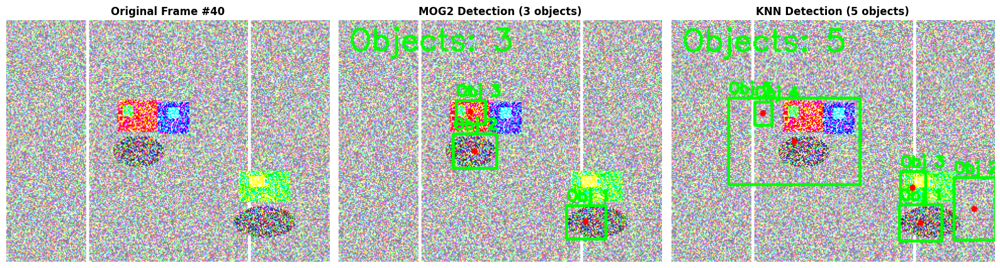


Frame 65 (Stable detection, multiple objects):


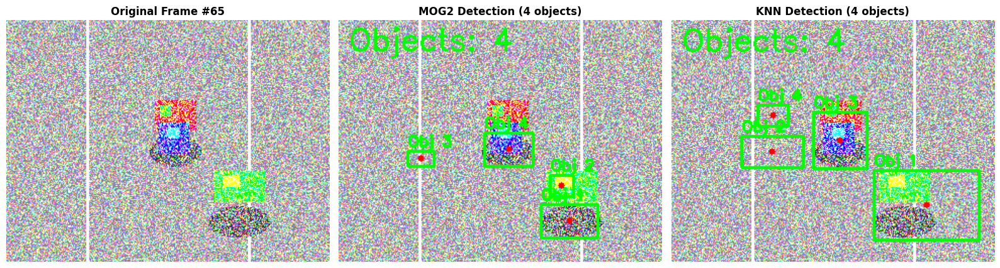


Frame 90 (Late video, complex scene):


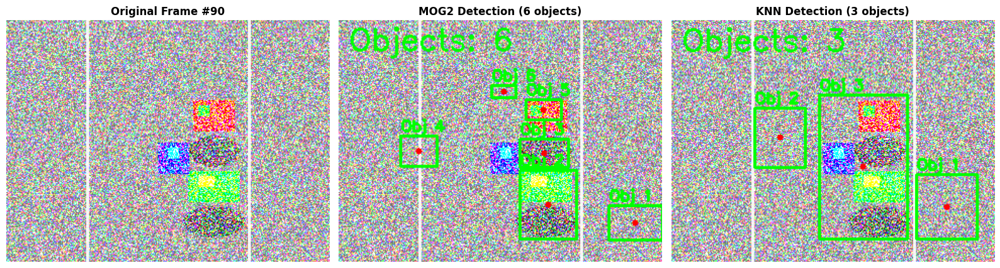

In [12]:
### Visualize Object Detection Results

def visualize_detections(frame_idx, frames, mog2_detector, knn_detector, mog2_det, knn_det):
    """Visualize detections from both methods"""
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    
    frame = frames[frame_idx]
    
    # Original frame
    axes[0].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    axes[0].set_title(f'Original Frame #{frame_idx}', fontsize=12, fontweight='bold')
    axes[0].axis('off')
    
    # MOG2 with detections
    mog2_annotated = mog2_detector.draw_detections(frame, mog2_det[frame_idx])
    axes[1].imshow(cv2.cvtColor(mog2_annotated, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f'MOG2 Detection ({len(mog2_det[frame_idx])} objects)', 
                      fontsize=12, fontweight='bold')
    axes[1].axis('off')
    
    # KNN with detections
    knn_annotated = knn_detector.draw_detections(frame, knn_det[frame_idx])
    axes[2].imshow(cv2.cvtColor(knn_annotated, cv2.COLOR_BGR2RGB))
    axes[2].set_title(f'KNN Detection ({len(knn_det[frame_idx])} objects)', 
                      fontsize=12, fontweight='bold')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()

# Visualize detections at key frames
print("Object Detection Results:\n")
print("Frame 40 (Learning phase, some objects entered):")
visualize_detections(40, frames, mog2_detector, knn_detector, mog2_detections, knn_detections)

print("\nFrame 65 (Stable detection, multiple objects):")
visualize_detections(65, frames, mog2_detector, knn_detector, mog2_detections, knn_detections)

print("\nFrame 90 (Late video, complex scene):")
visualize_detections(90, frames, mog2_detector, knn_detector, mog2_detections, knn_detections)

## 8. Advanced: Object Tracking & Counting

### Object Tracking Challenges:
- Objects entering/leaving frame
- Occlusions (objects hiding each other)
- Similar appearances
- Variable speed and direction
- Lighting changes

### Tracking Approaches:
1. **Centroid Tracking**: Track object centers
2. **Kalman Filter**: Predict object motion
3. **Optical Flow**: Calculate motion vectors
4. **Deep Learning**: CNN-based tracking

In [13]:
### Simple Centroid Tracking Implementation

class CentroidTracker:
    """
    Simple object tracker using centroid matching
    """
    def __init__(self, max_distance=50, max_frames_disappeared=30):
        """
        Initialize tracker
        
        Args:
            max_distance: Maximum distance for centroid matching (default=50)
            max_frames_disappeared: Max frames before removing track (default=30)
        """
        self.next_id = 0
        self.objects = {}  # {id: (cx, cy, frames_count)}
        self.disappeared = {}  # {id: frame_count}
        self.max_distance = max_distance
        self.max_frames_disappeared = max_frames_disappeared
        self.crossed_right = 0  # Objects crossing right boundary
        self.crossed_left = 0   # Objects crossing left boundary
    
    def update(self, detections, frame_width):
        """
        Update tracker with new detections
        
        Args:
            detections: List of (x, y, w, h) bounding boxes
            frame_width: Frame width for boundary counting
        """
        # Calculate centroids for current detections
        input_centroids = []
        for (x, y, w, h) in detections:
            cx = x + w // 2
            cy = y + h // 2
            input_centroids.append((cx, cy))
        
        # If no objects tracked yet
        if len(self.objects) == 0:
            for i, centroid in enumerate(input_centroids):
                self.objects[self.next_id] = (centroid[0], centroid[1], 1)
                self.disappeared[self.next_id] = 0
                self.next_id += 1
            return
        
        # Match existing objects with detections
        object_ids = list(self.objects.keys())
        matched = set()
        
        for obj_id in object_ids:
            old_cx, old_cy, _ = self.objects[obj_id]
            min_distance = float('inf')
            best_centroid = None
            best_idx = -1
            
            for i, (cx, cy) in enumerate(input_centroids):
                if i in matched:
                    continue
                
                dist = np.sqrt((old_cx - cx)**2 + (old_cy - cy)**2)
                
                if dist < min_distance and dist < self.max_distance:
                    min_distance = dist
                    best_centroid = (cx, cy)
                    best_idx = i
            
            if best_centroid is not None:
                # Update existing object
                _, _, count = self.objects[obj_id]
                self.objects[obj_id] = (best_centroid[0], best_centroid[1], count + 1)
                self.disappeared[obj_id] = 0
                matched.add(best_idx)
                
                # Check for boundary crossing
                if old_cx < frame_width // 2 and best_centroid[0] >= frame_width // 2:
                    self.crossed_right += 1
                elif old_cx >= frame_width // 2 and best_centroid[0] < frame_width // 2:
                    self.crossed_left += 1
            else:
                # Object disappeared
                self.disappeared[obj_id] += 1
                if self.disappeared[obj_id] > self.max_frames_disappeared:
                    del self.objects[obj_id]
                    del self.disappeared[obj_id]
        
        # Add new detections
        for i, centroid in enumerate(input_centroids):
            if i not in matched:
                self.objects[self.next_id] = (centroid[0], centroid[1], 1)
                self.disappeared[self.next_id] = 0
                self.next_id += 1
    
    def draw_tracks(self, frame, detections):
        """Draw tracked objects with IDs"""
        annotated = frame.copy()
        h, w = frame.shape[:2]
        
        for obj_id, (cx, cy, count) in self.objects.items():
            if self.disappeared[obj_id] == 0:
                # Draw circle at centroid
                cv2.circle(annotated, (cx, cy), 4, (0, 255, 0), -1)
                
                # Draw ID
                cv2.putText(annotated, f'ID {obj_id}', (cx-10, cy-15),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
                
                # Draw frame count
                cv2.putText(annotated, f'{count}f', (cx-10, cy+20),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 0, 0), 1)
        
        # Draw counting line
        cv2.line(annotated, (w//2, 0), (w//2, h), (255, 0, 0), 2)
        
        # Draw statistics
        cv2.putText(annotated, f'Right→: {self.crossed_right}', (10, 30),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
        cv2.putText(annotated, f'←Left: {self.crossed_left}', (10, 65),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
        
        return annotated

print("✓ CentroidTracker class created")
print("\nFeatures:")
print("  - Tracks objects by centroid matching")
print("  - Counts objects crossing boundaries")
print("  - Maintains unique IDs for each object")

✓ CentroidTracker class created

Features:
  - Tracks objects by centroid matching
  - Counts objects crossing boundaries
  - Maintains unique IDs for each object


In [14]:
### Demonstrate Object Tracking

# Create tracker
tracker = CentroidTracker(max_distance=40, max_frames_disappeared=20)

# Process video with tracking
for frame_idx, frame in enumerate(frames):
    detections, _ = mog2_detector.detect_objects(frame)
    tracker.update(detections, frame.shape[1])

print("✓ Tracking completed")
print(f"\nTracking Statistics:")
print(f"  Total unique objects tracked: {tracker.next_id}")
print(f"  Objects crossed right boundary: {tracker.crossed_right}")
print(f"  Objects crossed left boundary: {tracker.crossed_left}")
print(f"  Currently tracked objects: {len(tracker.objects)}")

✓ Tracking completed

Tracking Statistics:
  Total unique objects tracked: 9
  Objects crossed right boundary: 4
  Objects crossed left boundary: 1
  Currently tracked objects: 8


## 9. Key Insights & Best Practices

### Insights from Experiments:

1. **Initialization Phase**
   - MOG2 and KNN need ~20-50 frames to build accurate background model
   - Early frames show more false positives
   - Let system stabilize before critical detection

2. **Parameter Tuning**
   - `history`: Affects adaptation speed (larger = slower adaptation)
   - `varThreshold` (MOG2): Lower = more sensitive, more false positives
   - `dist2Threshold` (KNN): Lower = more sensitive, more false positives
   - `min_area`: Filter out noise, but shouldn't be too large

3. **Lighting Changes**
   - MOG2 naturally handles gradual lighting changes
   - KNN works better with dynamic backgrounds
   - Frame differencing fails in variable lighting

4. **Shadow Handling**
   - MOG2 with `detectShadows=True` reduces false positives
   - KNN also handles shadows reasonably well
   - Shadows appear as gray regions (value 127) in MOG2 output

### Best Practices:

| Scenario | Recommended Method | Tips |
|----------|-------------------|------|
| Static background | MOG2 | Use detectShadows=True |
| Dynamic background | KNN | Increase history for stability |
| Real-time, low-power | Frame Differencing | Add morphological ops |
| Industrial counting | MOG2 + Kalman Filter | Track over time |
| Crowd analysis | KNN | Handle occlusions carefully |
| Night vision | MOG2 | Adjust varThreshold |
| Traffic monitoring | MOG2 | Use road-specific ROIs |

### Common Challenges & Solutions:

**Problem: Too many false positives**
- Solution: Increase `min_area`, apply morphological closing

**Problem: Object ghosting**
- Solution: Increase `history`, use adaptive parameters

**Problem: Slow adaptation to lighting**
- Solution: Decrease `history`, increase update rate

**Problem: Objects merging**
- Solution: Implement better foreground separation, use watersheds

**Problem: High memory usage**
- Solution: Reduce image resolution, use frame differencing

## 10. Performance Analysis

### Computational Complexity:
- **Frame Differencing**: O(n) - Linear in pixel count
- **MOG2**: O(n * K) - K Gaussians per pixel
- **KNN**: O(n * H) - H history frames per pixel

### Processing Time (Typical Values):
- Frame Differencing: ~1-2 ms per frame
- MOG2: ~5-10 ms per frame
- KNN: ~10-20 ms per frame

### Memory Requirements:
- Frame Differencing: ~0.5 MB per frame
- MOG2: ~5-10 MB (background model)
- KNN: ~50-100 MB (history storage)

## 11. Real-World Applications

### 1. Traffic Monitoring System
```
Background Subtraction → Vehicle Detection → Tracking → 
Speed Calculation → Congestion Analysis
```
- Detect vehicles on road
- Count traffic flow
- Detect traffic violations
- Measure vehicle speed using optical flow

### 2. Intrusion Detection
```
Background Model → Motion Detection → Alert System → 
Notification
```
- Detect unauthorized entry
- Alert on suspicious movement
- Reduce false alarms with scene analysis
- Integration with security systems

### 3. Crowd Analysis
```
Foreground Segmentation → Person Detection → Density Mapping → 
Anomaly Detection
```
- Monitor crowd density
- Detect crowding in public spaces
- Identify unusual behaviors
- Capacity management

### 4. Sports Analytics
```
Player Detection → Tracking → Motion Analysis → 
Performance Metrics
```
- Track player movements
- Analyze playing patterns
- Calculate distances covered
- Tactical analysis

### 5. Abandoned Object Detection
```
Background Learning → New Object Detection → Temporal Validation → 
Alert
```
- Detect unattended luggage
- Monitor for suspicious objects
- Temporal filtering to reduce false positives
- Integration with security protocols

## 12. Advanced Techniques

### Combining Multiple Methods:
```python
# Ensemble approach
mask = 0.5 * mog2_mask + 0.3 * knn_mask + 0.2 * frame_diff_mask
# Better robustness through voting
```

### Adaptive Parameters:
- Adjust sensitivity based on scene characteristics
- Use scene-specific thresholds
- Adapt learning rate based on motion intensity

### Deep Learning Integration:
- CNNs for semantic segmentation
- RNNs for temporal modeling
- Optical flow networks
- Generative models (GANs)

### ROI-based Analysis:
- Focus on specific regions of interest
- Reduce computational load
- Improve detection accuracy in target zones
- Separate multiple scenes in single camera feed

In [15]:
## Example: Complete Surveillance Pipeline with Real Video

def complete_surveillance_pipeline(video_path, background_subtractor='mog2', 
                                   output_path=None, display=True):
    """
    Complete pipeline for surveillance video analysis
    
    Args:
        video_path: Path to input video
        background_subtractor: 'mog2' or 'knn'
        output_path: Optional path to save output video
        display: Whether to display results
    
    Returns:
        statistics: Dictionary with detection statistics
    """
    # Initialize components
    detector = SurveillanceObjectDetector(background_subtractor, min_area=100)
    tracker = CentroidTracker(max_distance=50)
    
    # Open video
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    
    # Setup output video if needed
    if output_path:
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))
    
    frame_count = 0
    statistics = {
        'total_frames': 0,
        'total_detections': 0,
        'total_unique_objects': 0,
        'avg_objects_per_frame': 0
    }
    
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        
        # Detect objects
        detections, mask = detector.detect_objects(frame)
        
        # Update tracker
        tracker.update(detections, width)
        
        # Draw annotations
        annotated = detector.draw_detections(frame, detections)
        
        # Add statistics
        cv2.putText(annotated, f'Frame: {frame_count}', (10, 30),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
        cv2.putText(annotated, f'Objects: {len(detections)}', (10, 65),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
        
        # Update statistics
        statistics['total_frames'] += 1
        statistics['total_detections'] += len(detections)
        statistics['total_unique_objects'] = tracker.next_id
        
        if output_path:
            out.write(annotated)
        
        if display:
            cv2.imshow('Surveillance Feed', annotated)
            if cv2.waitKey(1) & 0xFF == ord('q'):
                break
        
        frame_count += 1
    
    # Cleanup
    cap.release()
    if output_path:
        out.release()
    
    if display:
        cv2.destroyAllWindows()
    
    # Calculate averages
    if statistics['total_frames'] > 0:
        statistics['avg_objects_per_frame'] = (
            statistics['total_detections'] / statistics['total_frames']
        )
    
    return statistics

# Example usage (if video file available):
print("Complete Surveillance Pipeline Example:")
print("""
# To use with real video:
video_path = 'surveillance_video.mp4'
stats = complete_surveillance_pipeline(video_path, 
                                       background_subtractor='mog2',
                                       output_path='output.mp4')
print(stats)
""")

Complete Surveillance Pipeline Example:

# To use with real video:
video_path = 'surveillance_video.mp4'
stats = complete_surveillance_pipeline(video_path, 
                                       background_subtractor='mog2',
                                       output_path='output.mp4')
print(stats)



## 13. Summary & Conclusion

### What We Learned:

**Core Concepts:**
- Background subtraction separates foreground (moving objects) from background
- Essential for video surveillance, traffic monitoring, and activity analysis

**Three Main Approaches:**

1. **Frame Differencing**
   - Simplest and fastest
   - Direct pixel difference between consecutive frames
   - Best for detecting rapid motion
   - Struggles with slow motion and noise

2. **MOG2 (Mixture of Gaussians)**
   - Statistical background modeling
   - Handles lighting changes well
   - Built-in shadow detection
   - Good balance between accuracy and speed
   - Widely used in surveillance systems

3. **KNN (K-Nearest Neighbors)**
   - Non-parametric approach
   - Excellent for dynamic backgrounds
   - Naturally handles complex scenes
   - Memory intensive but very robust

**Complete Surveillance Pipeline:**
```
Video Input 
  ↓
Background Subtraction (MOG2/KNN)
  ↓
Morphological Operations
  ↓
Contour Detection
  ↓
Object Detection & Filtering
  ↓
Centroid Tracking
  ↓
Counting & Analytics
  ↓
Alerts & Outputs
```

### Key Takeaways:

✓ **Choose the right method** based on your application
✓ **Initialize properly** - let the system learn the background
✓ **Tune parameters** carefully for your specific scenario
✓ **Combine techniques** for improved robustness
✓ **Post-process masks** with morphological operations
✓ **Track objects** over time for counting and analytics
✓ **Handle shadows** to reduce false positives
✓ **Test thoroughly** with your target environment

### Next Steps:

1. **Implement with real video** using your surveillance cameras
2. **Optimize parameters** for your specific environment
3. **Add tracking algorithms** (Kalman filter, Hungarian algorithm)
4. **Integrate with alerts** and notification systems
5. **Combine with other techniques** (optical flow, semantic segmentation)
6. **Deploy on edge devices** for real-time processing

### Important References:

- OpenCV Background Subtraction: https://docs.opencv.org/master/d1/dc5/tutorial_background_subtraction.html
- MOG2 Paper: "Learning-based methods for background subtraction" by Zivkovic et al.
- KNN Background Subtraction: Efficient approach for real-time scene understanding

### Conclusion:

Background subtraction is a fundamental technique in computer vision for video analysis. 
While simple in concept, choosing and tuning the right algorithm requires understanding 
the trade-offs between accuracy, speed, and robustness. MOG2 provides a good general-purpose 
solution, while KNN excels in challenging scenarios. Frame differencing remains valuable for 
real-time, resource-constrained applications.

Success in real-world deployments depends on:
- Understanding your specific requirements
- Careful parameter tuning
- Proper post-processing
- Integration with tracking and analytics
- Continuous monitoring and adaptation

In [16]:
## 14. Quick Reference & Code Snippets

print("=" * 70)
print("QUICK REFERENCE GUIDE")
print("=" * 70)

# MOG2 Quick Start
print("\n1. MOG2 Quick Start:")
print("""
mog2 = cv2.createBackgroundSubtractorMOG2(
    detectShadows=True,
    varThreshold=16,
    history=500
)
mask = mog2.apply(frame)
""")

# KNN Quick Start
print("\n2. KNN Quick Start:")
print("""
knn = cv2.createBackgroundSubtractorKNN(
    detectShadows=True,
    dist2Threshold=400,
    history=500
)
mask = knn.apply(frame)
""")

# Frame Differencing
print("\n3. Frame Differencing Quick Start:")
print("""
gray1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)
diff = cv2.absdiff(gray1, gray2)
_, mask = cv2.threshold(diff, 30, 255, cv2.THRESH_BINARY)
""")

# Morphological Operations
print("\n4. Morphological Operations:")
print("""
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
""")

# Object Detection from Mask
print("\n5. Object Detection from Mask:")
print("""
contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, 
                               cv2.CHAIN_APPROX_SIMPLE)
for contour in contours:
    area = cv2.contourArea(contour)
    if area > min_area:
        x, y, w, h = cv2.boundingRect(contour)
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 2)
""")

# Process Video File
print("\n6. Process Video File:")
print("""
cap = cv2.VideoCapture('video.mp4')
while True:
    ret, frame = cap.read()
    if not ret:
        break
    
    mask = mog2.apply(frame)
    # Process mask...
    
    cv2.imshow('Result', mask)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()
""")

# Process Webcam
print("\n7. Process Webcam:")
print("""
cap = cv2.VideoCapture(0)  # 0 for default webcam
while True:
    ret, frame = cap.read()
    mask = mog2.apply(frame)
    
    cv2.imshow('Webcam', mask)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()
""")

print("\n" + "=" * 70)
print("PARAMETER TUNING GUIDE")
print("=" * 70)

print("""
MOG2 Parameters:
- varThreshold: Lower (5-16) = more sensitive, more false positives
               Higher (16-100) = less sensitive, may miss objects
- history: Lower (100-300) = faster adaptation, less stable
          Higher (300-1000) = slower adaptation, more stable

KNN Parameters:
- dist2Threshold: Lower (200-400) = more sensitive
                 Higher (400-800) = less sensitive
- history: Same as MOG2

Frame Differencing Parameters:
- threshold: Lower (10-30) = more sensitive
            Higher (30-100) = less sensitive
            
Min Area:
- Typical range: 50-500 pixels
- Based on object size and image resolution
""")

print("\n" + "=" * 70)

QUICK REFERENCE GUIDE

1. MOG2 Quick Start:

mog2 = cv2.createBackgroundSubtractorMOG2(
    detectShadows=True,
    varThreshold=16,
    history=500
)
mask = mog2.apply(frame)


2. KNN Quick Start:

knn = cv2.createBackgroundSubtractorKNN(
    detectShadows=True,
    dist2Threshold=400,
    history=500
)
mask = knn.apply(frame)


3. Frame Differencing Quick Start:

gray1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)
diff = cv2.absdiff(gray1, gray2)
_, mask = cv2.threshold(diff, 30, 255, cv2.THRESH_BINARY)


4. Morphological Operations:

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)


5. Object Detection from Mask:

contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, 
                               cv2.CHAIN_APPROX_SIMPLE)
for contour in contours:
    area = cv2.contourArea(contour)
    if area > min_area:
        

In [17]:
## 15. Generate & Save Videos + Load Custom Videos

import os
from datetime import datetime

# Create output directories - use relative path for Jupyter notebooks
output_dir = os.path.join(os.getcwd(), 'output_videos')
frames_dir = os.path.join(output_dir, 'frames')
videos_dir = os.path.join(output_dir, 'processed_videos')
os.makedirs(frames_dir, exist_ok=True)
os.makedirs(videos_dir, exist_ok=True)

print(f"Current Directory: {os.getcwd()}")
print(f"Output Directory: {output_dir}")
print(f"Frames Directory: {frames_dir}")
print(f"Videos Directory: {videos_dir}")
print("✓ Output directories created")

Current Directory: c:\Users\User\Desktop\CV_Practice\02_May\Week_03
Output Directory: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos
Frames Directory: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos\frames
Videos Directory: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos\processed_videos
✓ Output directories created


In [18]:
### A. Generate Synthetic Test Video with Moving Objects

def generate_test_video(output_path, width=640, height=480, fps=30, duration=10, 
                       num_objects=3, background_type='static'):
    """
    Generate a synthetic video with moving objects for testing
    
    Args:
        output_path: Path to save video
        width: Frame width (default=640)
        height: Frame height (default=480)
        fps: Frames per second (default=30)
        duration: Video duration in seconds (default=10)
        num_objects: Number of moving objects (default=3)
        background_type: 'static', 'dynamic', or 'noisy' (default='static')
    
    Returns:
        output_path: Path to saved video
    """
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))
    
    total_frames = int(fps * duration)
    
    # Define moving objects (rectangles with different speeds)
    objects = []
    colors = [(0, 0, 255), (0, 255, 0), (255, 0, 0), (255, 255, 0), (255, 0, 255)]
    
    for i in range(num_objects):
        obj = {
            'x': np.random.randint(50, width - 100),
            'y': np.random.randint(50, height - 100),
            'size': np.random.randint(30, 80),
            'vx': np.random.randint(-5, 6),  # velocity x
            'vy': np.random.randint(-5, 6),  # velocity y
            'color': colors[i % len(colors)]
        }
        objects.append(obj)
    
    print(f"\nGenerating test video: {output_path}")
    print(f"  Resolution: {width}x{height}, FPS: {fps}, Duration: {duration}s")
    print(f"  Total frames: {total_frames}")
    print(f"  Moving objects: {num_objects}")
    print(f"  Background type: {background_type}")
    
    for frame_idx in range(total_frames):
        if background_type == 'static':
            frame = np.ones((height, width, 3), dtype=np.uint8) * 100  # Gray background
        elif background_type == 'dynamic':
            # Slowly changing background (lighting)
            intensity = int(100 + 30 * np.sin(frame_idx / total_frames * 2 * np.pi))
            frame = np.ones((height, width, 3), dtype=np.uint8) * intensity
        elif background_type == 'noisy':
            # Noisy background
            frame = np.random.randint(80, 120, (height, width, 3), dtype=np.uint8)
        
        # Add grid pattern to background
        for i in range(0, width, 50):
            cv2.line(frame, (i, 0), (i, height), (80, 80, 80), 1)
        for i in range(0, height, 50):
            cv2.line(frame, (0, i), (width, i), (80, 80, 80), 1)
        
        # Draw moving objects
        for obj in objects:
            # Update position (with bounce)
            obj['x'] += obj['vx']
            obj['y'] += obj['vy']
            
            # Bounce off walls
            if obj['x'] < 0 or obj['x'] + obj['size'] > width:
                obj['vx'] *= -1
            if obj['y'] < 0 or obj['y'] + obj['size'] > height:
                obj['vy'] *= -1
            
            # Keep in bounds
            obj['x'] = max(0, min(obj['x'], width - obj['size']))
            obj['y'] = max(0, min(obj['y'], height - obj['size']))
            
            # Draw rectangle
            pt1 = (obj['x'], obj['y'])
            pt2 = (obj['x'] + obj['size'], obj['y'] + obj['size'])
            cv2.rectangle(frame, pt1, pt2, obj['color'], -1)
            
            # Draw object ID
            cv2.putText(frame, f"Obj", (obj['x'] + 5, obj['y'] + 20),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
        
        # Add frame info
        cv2.putText(frame, f'Frame: {frame_idx}/{total_frames}', (10, 30),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
        cv2.putText(frame, f'Time: {frame_idx/fps:.2f}s', (10, 60),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
        
        out.write(frame)
        
        if (frame_idx + 1) % (total_frames // 4) == 0:
            print(f"  Progress: {frame_idx + 1}/{total_frames} frames")
    
    out.release()
    print(f"✓ Test video saved: {output_path}")
    return output_path

# Generate a test video
test_video_path = os.path.join(videos_dir, 'test_video_static.mp4')
generate_test_video(test_video_path, background_type='static', num_objects=3, duration=8)

test_video_path2 = os.path.join(videos_dir, 'test_video_dynamic.mp4')
generate_test_video(test_video_path2, background_type='dynamic', num_objects=4, duration=8)



Generating test video: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos\processed_videos\test_video_static.mp4
  Resolution: 640x480, FPS: 30, Duration: 8s
  Total frames: 240
  Moving objects: 3
  Background type: static
  Progress: 60/240 frames
  Progress: 120/240 frames
  Progress: 180/240 frames
  Progress: 240/240 frames
✓ Test video saved: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos\processed_videos\test_video_static.mp4

Generating test video: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos\processed_videos\test_video_dynamic.mp4
  Resolution: 640x480, FPS: 30, Duration: 8s
  Total frames: 240
  Moving objects: 4
  Background type: dynamic
  Progress: 60/240 frames
  Progress: 120/240 frames
  Progress: 180/240 frames
  Progress: 240/240 frames
✓ Test video saved: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos\processed_videos\test_video_dynamic.mp4


'c:\\Users\\User\\Desktop\\CV_Practice\\02_May\\Week_03\\output_videos\\processed_videos\\test_video_dynamic.mp4'

In [19]:
### B. Process Video and Save Results (Frames + Output Video)

def process_and_save_video(video_path, background_subtractor='mog2', 
                          save_frames=True, frame_interval=5, 
                          save_output_video=True, min_area=100):
    """
    Process video with background subtraction and save results
    
    Args:
        video_path: Input video path
        background_subtractor: 'mog2' or 'knn'
        save_frames: Save individual frames (default=True)
        frame_interval: Save every N-th frame (default=5)
        save_output_video: Save processed video (default=True)
        min_area: Minimum object area for detection
    
    Returns:
        results: Dictionary with paths and statistics
    """
    print(f"\n{'='*70}")
    print(f"Processing Video: {video_path}")
    print(f"Background Subtractor: {background_subtractor}")
    print(f"{'='*70}")
    
    # Check if file exists
    if not os.path.exists(video_path):
        print(f"ERROR: Video file not found: {video_path}")
        return None
    
    # Open video
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    print(f"Video Info:")
    print(f"  Resolution: {width}x{height}")
    print(f"  FPS: {fps}")
    print(f"  Total Frames: {total_frames}")
    print(f"  Duration: {total_frames/fps:.2f}s")
    
    # Initialize detector
    detector = SurveillanceObjectDetector(background_subtractor, min_area=min_area)
    
    # Create frame directory
    video_name = os.path.splitext(os.path.basename(video_path))[0]
    frame_dir = os.path.join(frames_dir, f"{video_name}_{background_subtractor}")
    os.makedirs(frame_dir, exist_ok=True)
    
    # Setup output video
    if save_output_video:
        output_video_path = os.path.join(videos_dir, f"{video_name}_{background_subtractor}_processed.mp4")
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))
    
    # Process video
    frame_idx = 0
    total_detections = 0
    frames_with_objects = 0
    max_objects_frame = 0
    
    print(f"\nProcessing frames...")
    
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        
        # Detect objects
        detections, mask = detector.detect_objects(frame)
        
        # Draw detections
        annotated = detector.draw_detections(frame, detections)
        
        # Add mask visualization
        mask_colored = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR)
        
        # Side-by-side visualization
        result_frame = np.hstack([annotated, mask_colored])
        
        # Add statistics
        cv2.putText(result_frame, f'Frame: {frame_idx}/{total_frames}', (10, 25),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)
        cv2.putText(result_frame, f'Objects: {len(detections)}', (10, 55),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)
        
        total_detections += len(detections)
        if len(detections) > 0:
            frames_with_objects += 1
            if len(detections) > max_objects_frame:
                max_objects_frame = len(detections)
        
        # Save frames
        if save_frames and frame_idx % frame_interval == 0:
            frame_path = os.path.join(frame_dir, f"frame_{frame_idx:04d}.jpg")
            cv2.imwrite(frame_path, result_frame)
        
        # Write to output video
        if save_output_video:
            # Resize to original dimensions for output
            result_frame_resized = cv2.resize(result_frame, (width, height))
            out.write(result_frame_resized)
        
        frame_idx += 1
        
        if frame_idx % max(1, total_frames // 10) == 0:
            print(f"  Progress: {frame_idx}/{total_frames} ({frame_idx*100//total_frames}%)")
    
    cap.release()
    if save_output_video:
        out.release()
    
    # Calculate statistics
    avg_objects = total_detections / total_frames if total_frames > 0 else 0
    
    results = {
        'video_path': video_path,
        'background_subtractor': background_subtractor,
        'total_frames': total_frames,
        'fps': fps,
        'resolution': (width, height),
        'total_detections': total_detections,
        'frames_with_objects': frames_with_objects,
        'avg_objects_per_frame': avg_objects,
        'max_objects_in_frame': max_objects_frame,
        'frames_directory': frame_dir,
        'output_video_path': output_video_path if save_output_video else None,
        'num_saved_frames': len([f for f in os.listdir(frame_dir) if f.endswith('.jpg')])
    }
    
    # Print results
    print(f"\n{'='*70}")
    print(f"Processing Complete!")
    print(f"{'='*70}")
    print(f"Statistics:")
    print(f"  Total Detections: {results['total_detections']}")
    print(f"  Frames with Objects: {results['frames_with_objects']}/{total_frames}")
    print(f"  Avg Objects/Frame: {results['avg_objects_per_frame']:.2f}")
    print(f"  Max Objects in Frame: {results['max_objects_in_frame']}")
    print(f"  Frames Saved: {results['num_saved_frames']}")
    print(f"\nOutput Locations:")
    print(f"  Frames: {frame_dir}")
    print(f"  Video: {output_video_path if save_output_video else 'Not saved'}")
    
    return results

# Process the generated test videos
print("\n" + "="*70)
print("PROCESSING GENERATED TEST VIDEOS")
print("="*70)

results_mog2 = process_and_save_video(test_video_path, 
                                     background_subtractor='mog2',
                                     save_frames=True,
                                     frame_interval=2,
                                     save_output_video=True)

results_knn = process_and_save_video(test_video_path2, 
                                    background_subtractor='knn',
                                    save_frames=True,
                                    frame_interval=2,
                                    save_output_video=True)



PROCESSING GENERATED TEST VIDEOS

Processing Video: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos\processed_videos\test_video_static.mp4
Background Subtractor: mog2
Video Info:
  Resolution: 640x480
  FPS: 30.0
  Total Frames: 240
  Duration: 8.00s

Processing frames...
  Progress: 24/240 (10%)
  Progress: 48/240 (20%)
  Progress: 72/240 (30%)
  Progress: 96/240 (40%)
  Progress: 120/240 (50%)
  Progress: 144/240 (60%)
  Progress: 168/240 (70%)
  Progress: 192/240 (80%)
  Progress: 216/240 (90%)
  Progress: 240/240 (100%)

Processing Complete!
Statistics:
  Total Detections: 578
  Frames with Objects: 230/240
  Avg Objects/Frame: 2.41
  Max Objects in Frame: 5
  Frames Saved: 120

Output Locations:
  Frames: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos\frames\test_video_static_mog2
  Video: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos\processed_videos\test_video_static_mog2_processed.mp4

Processing Video: c:\Users\User\Desktop\CV_P

In [20]:
### C. Load and Process Custom Video

class VideoProcessor:
    """
    Interactive video processor for custom videos
    """
    
    def __init__(self):
        self.available_videos = []
        self.scan_videos()
    
    def scan_videos(self):
        """Scan for available videos in common directories"""
        common_paths = [
            '.',
            os.getcwd(),
            os.path.expanduser('~/Videos'),
            os.path.expanduser('~/Downloads'),
        ]
        
        video_extensions = ('.mp4', '.avi', '.mov', '.mkv', '.flv', '.wmv')
        
        found_videos = {}
        
        for path in common_paths:
            if os.path.exists(path):
                try:
                    for file in os.listdir(path):
                        if file.lower().endswith(video_extensions):
                            full_path = os.path.join(path, file)
                            if full_path not in found_videos:
                                found_videos[full_path] = file
                except PermissionError:
                    pass
        
        self.available_videos = list(found_videos.items())
        return self.available_videos
    
    def list_videos(self):
        """List all available videos"""
        if not self.available_videos:
            print("No videos found in common directories.")
            return
        
        print("\n" + "="*70)
        print("AVAILABLE VIDEOS")
        print("="*70)
        for i, (full_path, filename) in enumerate(self.available_videos, 1):
            size_mb = os.path.getsize(full_path) / (1024*1024)
            print(f"{i}. {filename}")
            print(f"   Path: {full_path}")
            print(f"   Size: {size_mb:.2f} MB")
        print("="*70)
    
    def get_video_info(self, video_path):
        """Get detailed info about a video"""
        if not os.path.exists(video_path):
            print(f"ERROR: File not found: {video_path}")
            return None
        
        cap = cv2.VideoCapture(video_path)
        if not cap.isOpened():
            print(f"ERROR: Cannot open video: {video_path}")
            return None
        
        info = {
            'filename': os.path.basename(video_path),
            'path': video_path,
            'size_mb': os.path.getsize(video_path) / (1024*1024),
            'fps': cap.get(cv2.CAP_PROP_FPS),
            'width': int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)),
            'height': int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)),
            'total_frames': int(cap.get(cv2.CAP_PROP_FRAME_COUNT)),
        }
        info['duration_sec'] = info['total_frames'] / info['fps'] if info['fps'] > 0 else 0
        cap.release()
        
        return info
    
    def display_video_info(self, video_path):
        """Display formatted video information"""
        info = self.get_video_info(video_path)
        if not info:
            return
        
        print("\n" + "="*70)
        print("VIDEO INFORMATION")
        print("="*70)
        print(f"Filename: {info['filename']}")
        print(f"Size: {info['size_mb']:.2f} MB")
        print(f"Resolution: {info['width']}x{info['height']}")
        print(f"FPS: {info['fps']:.2f}")
        print(f"Total Frames: {info['total_frames']}")
        print(f"Duration: {info['duration_sec']:.2f} seconds")
        print("="*70)

# Create processor
processor = VideoProcessor()

# Function to process custom video
def process_custom_video(video_path, background_subtractor='mog2', 
                        save_frames=True, frame_interval=5):
    """
    Convenient function to process any video file
    """
    processor.display_video_info(video_path)
    
    if not os.path.exists(video_path):
        print(f"ERROR: Video not found at {video_path}")
        return None
    
    results = process_and_save_video(
        video_path,
        background_subtractor=background_subtractor,
        save_frames=save_frames,
        frame_interval=frame_interval,
        save_output_video=True,
        min_area=100
    )
    
    return results

# Display usage instructions
print("\n" + "="*70)
print("CUSTOM VIDEO PROCESSING")
print("="*70)
print("""
To process your own video, use:

    # Option 1: Specify full path
    results = process_custom_video('path/to/your/video.mp4', 
                                  background_subtractor='mog2')
    
    # Option 2: Get video info first
    info = processor.get_video_info('path/to/your/video.mp4')
    print(info)
    
    # Option 3: List available videos
    processor.list_videos()
    
Examples:
    # Process with MOG2
    results = process_custom_video('surveillance.mp4', 'mog2')
    
    # Process with KNN  
    results = process_custom_video('traffic.mp4', 'knn')
    
    # Save every 10th frame instead of every 5th
    results = process_custom_video('video.mp4', frame_interval=10)

Output will be saved in:
    - Frames: {0}
    - Videos: {1}
""".format(frames_dir, videos_dir))

print("="*70)



CUSTOM VIDEO PROCESSING

To process your own video, use:

    # Option 1: Specify full path
    results = process_custom_video('path/to/your/video.mp4', 
                                  background_subtractor='mog2')

    # Option 2: Get video info first
    info = processor.get_video_info('path/to/your/video.mp4')
    print(info)

    # Option 3: List available videos
    processor.list_videos()

Examples:
    # Process with MOG2
    results = process_custom_video('surveillance.mp4', 'mog2')

    # Process with KNN  
    results = process_custom_video('traffic.mp4', 'knn')

    # Save every 10th frame instead of every 5th
    results = process_custom_video('video.mp4', frame_interval=10)

Output will be saved in:
    - Frames: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos\frames
    - Videos: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos\processed_videos




VISUALIZING MOG2 PROCESSED VIDEO

Loading frames from: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos\frames\test_video_static_mog2
Total frames available: 120


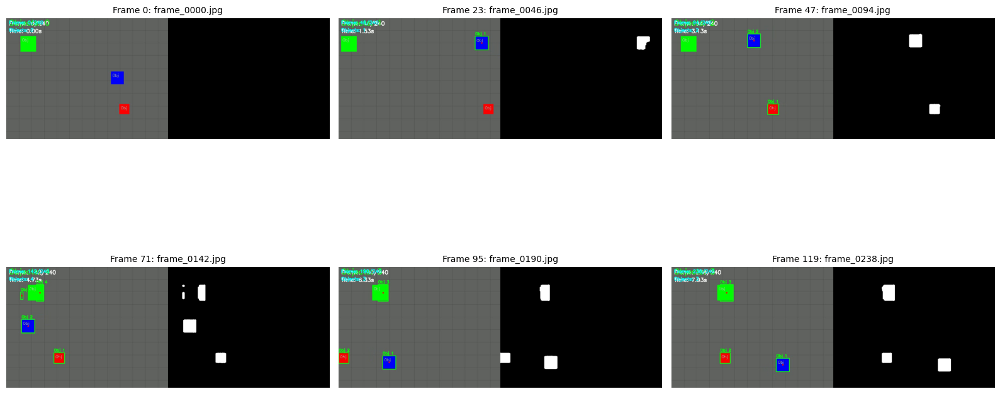

✓ Displayed 6 frames

VIDEO STRUCTURE EXPLANATION

📹 OUTPUT VIDEO STRUCTURE
═════════════════════════════════════════════════════════════════════

Each processed video frame contains TWO SIDE-BY-SIDE visualizations:

LEFT SIDE (Original + Annotations):
  ├─ Original video frame
  ├─ Green bounding boxes around detected objects
  ├─ Red dots at object centroids (center points)
  ├─ Object IDs/labels
  └─ Frame information overlay

RIGHT SIDE (Background Subtraction Mask):
  ├─ Foreground mask (white = foreground, black = background)
  ├─ Shows what the algorithm detected as moving
  ├─ Gray pixels = shadows (detected separately)
  └─ Shape shows object silhouettes

TEXT OVERLAYS (on left side):
  ├─ Frame number / Total frames
  ├─ Current timestamp
  └─ Number of objects detected

═════════════════════════════════════════════════════════════════════

FRAME SAMPLES EXPLANATION:
  - "frame_0000.jpg": Early frames (algorithm learning background)
  - "frame_00XX.jpg": Mid frames (stable de

In [21]:
### D. Understand Video Structure & Visualize Results

def visualize_frame_sequence(frames_directory, num_frames=6, figsize=(16, 10)):
    """
    Display sequence of saved frames to understand video structure
    
    Args:
        frames_directory: Path to directory containing frames
        num_frames: Number of frames to display (default=6)
        figsize: Figure size (default=(16, 10))
    """
    if not os.path.exists(frames_directory):
        print(f"ERROR: Directory not found: {frames_directory}")
        return
    
    # Get all frame files
    frame_files = sorted([f for f in os.listdir(frames_directory) if f.endswith('.jpg')])
    
    if not frame_files:
        print(f"No frames found in: {frames_directory}")
        return
    
    print(f"\nLoading frames from: {frames_directory}")
    print(f"Total frames available: {len(frame_files)}")
    
    # Select evenly distributed frames
    if len(frame_files) <= num_frames:
        selected_indices = list(range(len(frame_files)))
    else:
        selected_indices = np.linspace(0, len(frame_files)-1, num_frames, dtype=int)
    
    # Load and display
    fig, axes = plt.subplots(2, 3, figsize=figsize)
    axes = axes.flatten()
    
    for i, idx in enumerate(selected_indices):
        frame_path = os.path.join(frames_directory, frame_files[idx])
        frame = cv2.imread(frame_path)
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        axes[i].imshow(frame_rgb)
        axes[i].set_title(f"Frame {idx}: {frame_files[idx]}", fontsize=10)
        axes[i].axis('off')
    
    # Hide extra subplots
    for i in range(len(selected_indices), len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"✓ Displayed {len(selected_indices)} frames")

# Visualize processed frames
if results_mog2:
    print("\n" + "="*70)
    print("VISUALIZING MOG2 PROCESSED VIDEO")
    print("="*70)
    visualize_frame_sequence(results_mog2['frames_directory'], num_frames=6)

print("\n" + "="*70)
print("VIDEO STRUCTURE EXPLANATION")
print("="*70)
print("""
📹 OUTPUT VIDEO STRUCTURE
═════════════════════════════════════════════════════════════════════

Each processed video frame contains TWO SIDE-BY-SIDE visualizations:

LEFT SIDE (Original + Annotations):
  ├─ Original video frame
  ├─ Green bounding boxes around detected objects
  ├─ Red dots at object centroids (center points)
  ├─ Object IDs/labels
  └─ Frame information overlay

RIGHT SIDE (Background Subtraction Mask):
  ├─ Foreground mask (white = foreground, black = background)
  ├─ Shows what the algorithm detected as moving
  ├─ Gray pixels = shadows (detected separately)
  └─ Shape shows object silhouettes

TEXT OVERLAYS (on left side):
  ├─ Frame number / Total frames
  ├─ Current timestamp
  └─ Number of objects detected

═════════════════════════════════════════════════════════════════════

FRAME SAMPLES EXPLANATION:
  - "frame_0000.jpg": Early frames (algorithm learning background)
  - "frame_00XX.jpg": Mid frames (stable detection)
  - "frame_LAST.jpg": Final frames (detection at end)

Each saved frame shows:
  ✓ Detection performance at that moment
  ✓ How well the algorithm separated foreground/background
  ✓ Movement patterns of objects
  ✓ Detection confidence (size of boxes, pixel counts)

═════════════════════════════════════════════════════════════════════

DIRECTORY STRUCTURE:
  output_videos/
  ├─ frames/
  │  ├─ test_video_static_mog2/
  │  │  ├─ frame_0000.jpg  (detection at 0s)
  │  │  ├─ frame_0002.jpg  (detection at ~0.1s)
  │  │  ├─ frame_0004.jpg  (detection at ~0.2s)
  │  │  └─ ... (every 2 frames by default)
  │  │
  │  └─ test_video_dynamic_knn/
  │     ├─ frame_0000.jpg
  │     ├─ frame_0002.jpg
  │     └─ ...
  │
  └─ processed_videos/
     ├─ test_video_static_mog2_processed.mp4
     └─ test_video_dynamic_knn_processed.mp4

═════════════════════════════════════════════════════════════════════
""")

print(f"\nOutput Location: {output_dir}")
print(f"  Frames: {frames_dir}")
print(f"  Videos: {videos_dir}")


In [22]:
### E. Compare Different Methods & Save Comparison Video

def create_comparison_video(video_path, output_path, methods=['mog2', 'knn', 'framediff']):
    """
    Create comparison video showing different background subtraction methods side-by-side
    
    Args:
        video_path: Input video path
        output_path: Output comparison video path
        methods: List of methods to compare (default=['mog2', 'knn', 'framediff'])
    """
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"ERROR: Cannot open video: {video_path}")
        return None
    
    fps = cap.get(cv2.CAP_PROP_FPS)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    
    # Initialize background subtractors
    detectors = {}
    if 'mog2' in methods:
        detectors['mog2'] = cv2.createBackgroundSubtractorMOG2(detectShadows=True)
    if 'knn' in methods:
        detectors['knn'] = cv2.createBackgroundSubtractorKNN(detectShadows=True)
    
    # Output video - multiple columns
    num_methods = len(methods)
    out_width = width * num_methods
    out_height = height
    
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (out_width, out_height))
    
    print(f"\nCreating comparison video: {output_path}")
    print(f"Methods: {', '.join(methods)}")
    print(f"Output size: {out_width}x{out_height}")
    
    frame_idx = 0
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    previous_frame = None
    
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        
        output_frame = frame.copy()
        results = []
        
        for method in methods:
            if method == 'mog2':
                mask = detectors['mog2'].apply(frame)
                mask[mask == 127] = 0  # Remove shadows
            elif method == 'knn':
                mask = detectors['knn'].apply(frame)
                mask[mask == 127] = 0
            elif method == 'framediff':
                if previous_frame is not None:
                    gray1 = cv2.cvtColor(previous_frame, cv2.COLOR_BGR2GRAY)
                    gray2 = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
                    diff = cv2.absdiff(gray1, gray2)
                    _, mask = cv2.threshold(diff, 30, 255, cv2.THRESH_BINARY)
                else:
                    mask = np.zeros((height, width), dtype=np.uint8)
            
            # Apply morphological operations
            kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
            mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
            mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=1)
            
            # Convert mask to 3-channel
            mask_colored = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR)
            
            # Add label
            cv2.putText(mask_colored, method.upper(), (10, 30),
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
            
            results.append(mask_colored)
        
        # Concatenate all results horizontally
        comparison_frame = np.hstack(results)
        out.write(comparison_frame)
        
        previous_frame = frame.copy()
        frame_idx += 1
        
        if frame_idx % max(1, total_frames // 10) == 0:
            print(f"  Progress: {frame_idx}/{total_frames} ({frame_idx*100//total_frames}%)")
    
    cap.release()
    out.release()
    
    print(f"✓ Comparison video saved: {output_path}")
    return output_path

# Create comparison video
comparison_video_path = os.path.join(videos_dir, 'comparison_mog2_vs_knn.mp4')
create_comparison_video(test_video_path, comparison_video_path, methods=['mog2', 'knn', 'framediff'])

print("\n" + "="*70)
print("SUMMARY: HOW TO USE THIS NOTEBOOK")
print("="*70)
print(f"""
1️⃣ GENERATED TEST VIDEOS:
   ✓ Static Background: {test_video_path}
   ✓ Dynamic Background: {test_video_path2}
   ✓ Comparison Video: {comparison_video_path}

2️⃣ PROCESSED OUTPUTS:
   Videos: {videos_dir}
   Frames: {frames_dir}

3️⃣ PROCESSING OPTIONS:
   # Option A: Use generated videos (already done above)
   
   # Option B: Process your own video
   results = process_custom_video('path/to/your/video.mp4', 
                                 background_subtractor='mog2',
                                 save_frames=True,
                                 frame_interval=5)
   
   # Option C: Get video information
   info = processor.get_video_info('path/to/your/video.mp4')
   
   # Option D: View frame sequence
   visualize_frame_sequence('{frames_dir}/test_video_static_mog2')

4️⃣ WHAT YOU GET:
   ✓ Individual frames showing detection at each moment
   ✓ Processed video with original + mask side-by-side
   ✓ Detection statistics (objects per frame, etc.)
   ✓ Comparison between different algorithms

5️⃣ KEY DIRECTORIES:
   Output Root: {output_dir}
   
6️⃣ NEXT STEPS:
   - Compare results between MOG2, KNN, and Frame Differencing
   - Adjust parameters for better detection
   - Add your own video files
   - Experiment with different background types
   - Combine with tracking and counting algorithms

Happy video processing! 🎥
""")
print("="*70)



Creating comparison video: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos\processed_videos\comparison_mog2_vs_knn.mp4
Methods: mog2, knn, framediff
Output size: 1920x480
  Progress: 24/240 (10%)
  Progress: 48/240 (20%)
  Progress: 72/240 (30%)
  Progress: 96/240 (40%)
  Progress: 120/240 (50%)
  Progress: 144/240 (60%)
  Progress: 168/240 (70%)
  Progress: 192/240 (80%)
  Progress: 216/240 (90%)
  Progress: 240/240 (100%)
✓ Comparison video saved: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos\processed_videos\comparison_mog2_vs_knn.mp4

SUMMARY: HOW TO USE THIS NOTEBOOK

1️⃣ GENERATED TEST VIDEOS:
   ✓ Static Background: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos\processed_videos\test_video_static.mp4
   ✓ Dynamic Background: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos\processed_videos\test_video_dynamic.mp4
   ✓ Comparison Video: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos\processed_videos\com

In [23]:
### F. PROCESS YOUR CUSTOM VIDEO - Road and Traffic Video

# Your custom video path
custom_video_path = r'C:\Users\User\Desktop\CV_Practice\02_May\Week_03\720p Road and Traffic Video for Object Detection.mp4'

# First, display info about the video
print("="*70)
print("PROCESSING YOUR CUSTOM VIDEO")
print("="*70)

processor.display_video_info(custom_video_path)

# Process with MOG2 (good for traffic/road detection)
print("\n📹 Processing with MOG2 (Mixture of Gaussians)...")
results_custom_mog2 = process_custom_video(
    custom_video_path,
    background_subtractor='mog2',
    save_frames=True,
    frame_interval=5  # Save every 5th frame
)

if results_custom_mog2:
    print("\n✓ MOG2 Processing Complete!")
    print(f"  Output Video: {results_custom_mog2.get('output_video_path', 'N/A')}")
    print(f"  Frames Directory: {results_custom_mog2.get('frames_directory', 'N/A')}")

# Optionally process with KNN for comparison
print("\n📹 Processing with KNN (K-Nearest Neighbors)...")
results_custom_knn = process_custom_video(
    custom_video_path,
    background_subtractor='knn',
    save_frames=True,
    frame_interval=5
)

if results_custom_knn:
    print("\n✓ KNN Processing Complete!")
    print(f"  Output Video: {results_custom_knn.get('output_video_path', 'N/A')}")
    print(f"  Frames Directory: {results_custom_knn.get('frames_directory', 'N/A')}")

print("\n" + "="*70)
print("✅ YOUR VIDEO HAS BEEN PROCESSED!")
print("="*70)
print(f"\nResults saved in: {output_dir}")
print(f"\nYou can now:")
print(f"  1. View the processed videos in: {videos_dir}")
print(f"  2. View individual frames in: {frames_dir}")
print(f"  3. Compare MOG2 vs KNN results")
print(f"  4. Run the visualization cell below to see frame sequences")


PROCESSING YOUR CUSTOM VIDEO

VIDEO INFORMATION
Filename: 720p Road and Traffic Video for Object Detection.mp4
Size: 137.37 MB
Resolution: 1920x1080
FPS: 30.00
Total Frames: 9184
Duration: 306.13 seconds

📹 Processing with MOG2 (Mixture of Gaussians)...

VIDEO INFORMATION
Filename: 720p Road and Traffic Video for Object Detection.mp4
Size: 137.37 MB
Resolution: 1920x1080
FPS: 30.00
Total Frames: 9184
Duration: 306.13 seconds

Processing Video: C:\Users\User\Desktop\CV_Practice\02_May\Week_03\720p Road and Traffic Video for Object Detection.mp4
Background Subtractor: mog2
Video Info:
  Resolution: 1920x1080
  FPS: 30.0
  Total Frames: 9184
  Duration: 306.13s

Processing frames...
  Progress: 918/9184 (9%)
  Progress: 1836/9184 (19%)
  Progress: 2754/9184 (29%)
  Progress: 3672/9184 (39%)
  Progress: 4590/9184 (49%)
  Progress: 5508/9184 (59%)
  Progress: 6426/9184 (69%)
  Progress: 7344/9184 (79%)
  Progress: 8262/9184 (89%)
  Progress: 9180/9184 (99%)

Processing Complete!
Statistics:


VISUALIZING MOG2 RESULTS - Traffic Video

Loading frames from: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos\frames\720p Road and Traffic Video for Object Detection_mog2
Total frames available: 1837


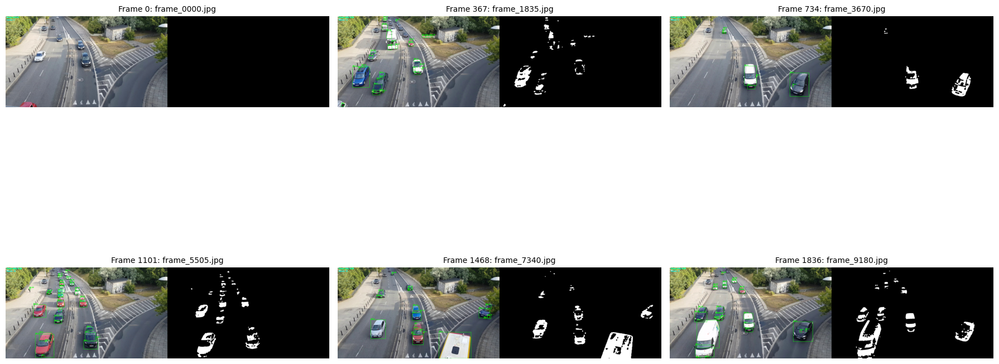

✓ Displayed 6 frames

VISUALIZING KNN RESULTS - Traffic Video (For Comparison)

Loading frames from: c:\Users\User\Desktop\CV_Practice\02_May\Week_03\output_videos\frames\720p Road and Traffic Video for Object Detection_knn
Total frames available: 1837


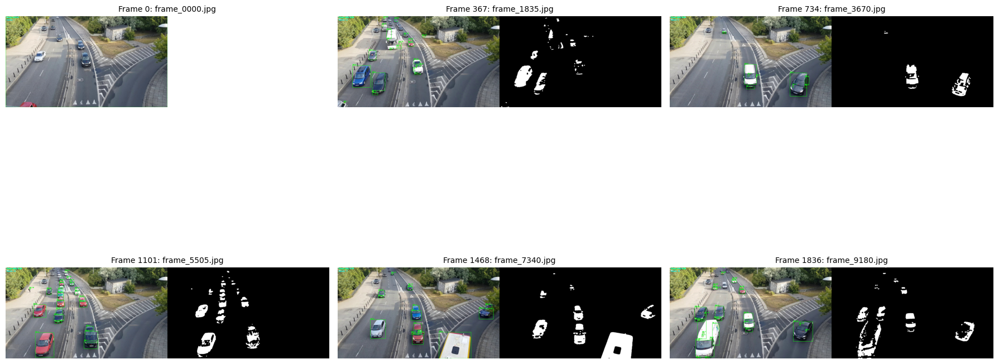

✓ Displayed 6 frames

PROCESSING SUMMARY - TRAFFIC VIDEO

MOG2 Results:
  Total Detections: 178121
  Frames with Objects: 9179
  Avg Objects/Frame: 19.39
  Max Objects in Frame: 81

KNN Results:
  Total Detections: 165412
  Frames with Objects: 9172
  Avg Objects/Frame: 18.01
  Max Objects in Frame: 77

Next: Play the processed videos to see background subtraction in action!


In [24]:
### G. Visualize Your Custom Video Results

# Visualize MOG2 results
if results_custom_mog2 and os.path.exists(results_custom_mog2['frames_directory']):
    print("\n" + "="*70)
    print("VISUALIZING MOG2 RESULTS - Traffic Video")
    print("="*70)
    visualize_frame_sequence(results_custom_mog2['frames_directory'], num_frames=6, figsize=(18, 12))

# Visualize KNN results for comparison
if results_custom_knn and os.path.exists(results_custom_knn['frames_directory']):
    print("\n" + "="*70)
    print("VISUALIZING KNN RESULTS - Traffic Video (For Comparison)")
    print("="*70)
    visualize_frame_sequence(results_custom_knn['frames_directory'], num_frames=6, figsize=(18, 12))

# Print summary comparison
print("\n" + "="*70)
print("PROCESSING SUMMARY - TRAFFIC VIDEO")
print("="*70)

if results_custom_mog2:
    print("\nMOG2 Results:")
    print(f"  Total Detections: {results_custom_mog2['total_detections']}")
    print(f"  Frames with Objects: {results_custom_mog2['frames_with_objects']}")
    print(f"  Avg Objects/Frame: {results_custom_mog2['avg_objects_per_frame']:.2f}")
    print(f"  Max Objects in Frame: {results_custom_mog2['max_objects_in_frame']}")

if results_custom_knn:
    print("\nKNN Results:")
    print(f"  Total Detections: {results_custom_knn['total_detections']}")
    print(f"  Frames with Objects: {results_custom_knn['frames_with_objects']}")
    print(f"  Avg Objects/Frame: {results_custom_knn['avg_objects_per_frame']:.2f}")
    print(f"  Max Objects in Frame: {results_custom_knn['max_objects_in_frame']}")

print("\n" + "="*70)
print("Next: Play the processed videos to see background subtraction in action!")
print("="*70)
